    # TAE --> Talento Altamente Especializado IA

    ## Módulo 4

    **Professor:** Dr German Pinedo
    **Student:**   Cesar Eduardo Inda Ceniceros

In [1]:
%pip install torchinfo

Note: you may need to restart the kernel to use updated packages.


Preprocessing transforms: ImageClassification(
    crop_size=[224]
    resize_size=[256]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BICUBIC
)
Number of classes (IMAGENET): 1000
Layer (type:depth-idx)                                  Output Shape              Param #
EfficientNet                                            [1, 1000]                 --
├─Sequential: 1-1                                       [1, 1280, 7, 7]           --
│    └─Conv2dNormActivation: 2-1                        [1, 32, 112, 112]         --
│    │    └─Conv2d: 3-1                                 [1, 32, 112, 112]         864
│    │    └─BatchNorm2d: 3-2                            [1, 32, 112, 112]         64
│    │    └─SiLU: 3-3                                   [1, 32, 112, 112]         --
│    └─Sequential: 2-2                                  [1, 16, 112, 112]         --
│    │    └─MBConv: 3-4                                 [1, 16, 112, 112]         1

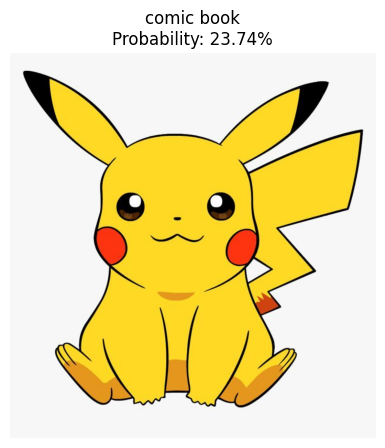

In [2]:
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from PIL import Image
from torchvision.models import efficientnet_b0, EfficientNet_B0_Weights
from torchinfo import summary

# Configuracion: cambia esta ruta por una imagen local.
IMAGE_PATH = "image.jpeg"

# El codigo usa GPU si esta disponible, o CPU si no lo esta.
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Cargamos EfficientNet-B0 con pesos preentrenados en ImageNet y modo evaluacion.
weights = EfficientNet_B0_Weights.DEFAULT
model = efficientnet_b0(weights=weights).to(device).eval()
preprocess = weights.transforms()
categories = weights.meta["categories"]
# print preprocess, categories, and model architecture for debugging
print("Preprocessing transforms:", preprocess)
print("Number of classes (IMAGENET):", len(categories))
# ipyvisualize the model summary
IpyWidgets = summary(model, input_size=(1, 3, 224, 224), device=device.type)
print(IpyWidgets)
# Cargamos la imagen original y aplicamos el preprocesamiento asociado a los pesos.
original_image = Image.open(IMAGE_PATH).convert("RGB")
original_size = original_image.size  # (width, height)
image_tensor = preprocess(original_image).unsqueeze(0).to(device)

# Inferencia: no entrenamos nada; solo calculamos la prediccion.
with torch.no_grad():
    logits = model(image_tensor)
    probabilities = torch.softmax(logits, dim=1)
    predicted_idx = int(probabilities.argmax(dim=1).item())
    predicted_class = categories[predicted_idx]
    predicted_probability = float(probabilities[0, predicted_idx].item())

print(f"Device: {device}")
print(f"Prediction: {predicted_class} ({predicted_probability:.2%})")

plt.figure(figsize=(5, 5))
plt.imshow(original_image)
plt.title(f"{predicted_class}\nProbability: {predicted_probability:.2%}")
plt.axis("off")
plt.show()


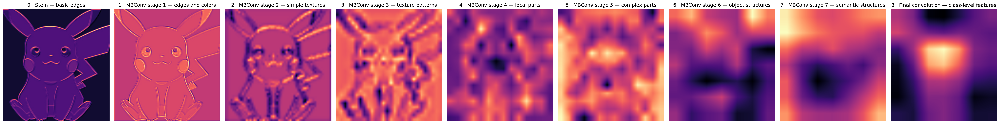

In [3]:
# Tres etapas representativas de model.features: temprana, intermedia y profunda.
# Las primeras capas suelen responder a bordes/colores; las profundas responden a estructuras mas semanticas.
selected_stages = {
    "0 · Stem — basic edges": model.features[0],
    "1 · MBConv stage 1 — edges and colors": model.features[1],
    "2 · MBConv stage 2 — simple textures": model.features[2],
    "3 · MBConv stage 3 — texture patterns": model.features[3],
    "4 · MBConv stage 4 — local parts": model.features[4],
    "5 · MBConv stage 5 — complex parts": model.features[5],
    "6 · MBConv stage 6 — object structures": model.features[6],
    "7 · MBConv stage 7 — semantic structures": model.features[7],
    "8 · Final convolution — class-level features": model.features[8],
}

def normalize_map(activation_map):
    activation_map = activation_map - activation_map.min()
    activation_map = activation_map / (activation_map.max() + 1e-8)
    return activation_map

def resize_map(activation_map, size):
    # size esta en formato PIL: (width, height). interpolate espera (height, width).
    tensor_map = torch.as_tensor(activation_map, dtype=torch.float32)[None, None]
    tensor_map = F.interpolate(tensor_map, size=(size[1], size[0]), mode="bilinear", align_corners=False)
    return tensor_map.squeeze().numpy()

feature_maps = {}
handles = []

def make_forward_hook(name):
    # Un forward hook guarda la salida de una capa durante el paso hacia adelante.
    def hook(module, inputs, output):
        feature_maps[name] = output.detach().cpu()
    return hook

for stage_name, stage_module in selected_stages.items():
    handles.append(stage_module.register_forward_hook(make_forward_hook(stage_name)))

with torch.no_grad():
    _ = model(image_tensor)

for handle in handles:
    handle.remove()

channel_average_maps = {}
for stage_name, feature_map in feature_maps.items():
    # Promedia los canales para resumir las respuestas visuales en un solo mapa 2D.
    averaged_map = feature_map.squeeze(0).mean(dim=0).numpy()
    averaged_map = resize_map(normalize_map(averaged_map), original_size)
    channel_average_maps[stage_name] = averaged_map

fig, axes = plt.subplots(1, 9, figsize=(34, 16), dpi=300)
for col, (stage_name, activation_map) in enumerate(channel_average_maps.items()):
    axes[col].imshow(activation_map, cmap="magma")
    axes[col].set_title(stage_name)
    axes[col].axis("off")

plt.tight_layout()
plt.show()


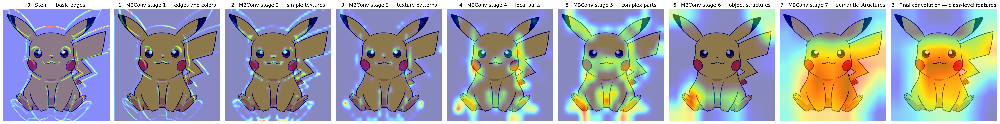

In [4]:
gradcam_activations = {}
gradcam_gradients = {}
handles = []

def make_gradcam_hook(name):
    # El forward hook guarda activaciones y tambien registra un hook de gradiente sobre esa salida.
    def hook(module, inputs, output):
        gradcam_activations[name] = output
        output.register_hook(lambda grad: gradcam_gradients.__setitem__(name, grad))
    return hook

for stage_name, stage_module in selected_stages.items():
    handles.append(stage_module.register_forward_hook(make_gradcam_hook(stage_name)))

model.zero_grad(set_to_none=True)
logits = model(image_tensor)
target_score = logits[0, predicted_idx]
target_score.backward()

for handle in handles:
    handle.remove()

gradcam_maps = {}
for stage_name in selected_stages:
    activations = gradcam_activations[stage_name].detach()
    gradients = gradcam_gradients[stage_name].detach()

    # Grad-CAM pondera cada canal por el promedio espacial de su gradiente para la clase objetivo.
    weights_per_channel = gradients.mean(dim=(2, 3), keepdim=True)
    cam = (weights_per_channel * activations).sum(dim=1).squeeze(0)
    cam = torch.relu(cam)  # Solo conservamos evidencia positiva para la clase predicha.
    cam = cam.cpu().numpy()
    gradcam_maps[stage_name] = resize_map(normalize_map(cam), original_size)

# Figura final: fila 1 imagen original, fila 2 mapas promedio por canal, fila 3 Grad-CAM.
fig, axes = plt.subplots(1, 9, figsize=(34, 16), dpi=300)
for col, stage_name in enumerate(selected_stages):

    axes[col].imshow(original_image)
    axes[col].imshow(gradcam_maps[stage_name], cmap="jet", alpha=0.45)
    axes[col].set_title(f"{stage_name}")
    axes[col].axis("off")
plt.tight_layout()
plt.show()
